In [159]:
import os, glob, shutil
os.environ['CUDA_VISIBLE_DEVICES'] = ''

import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import matplotlib._png as png
import torch
from PIL import Image
#from time import process_time


#torch.cuda.empty_cache()
print("Import done")

Import done


## Data Folder

The dataset is made up of images from three grades of PACS, in decreasing order of risk of PACG:

- Grade 1 (G1) - high risk
- Grade 2 (G2)
- Grade 3 (G3) - low risk

Dataset is organised as such:

FOLDER NAME: "Data"
- G3
    - images_original
    - images
    - labels
- G2
    - (same as G1)
- G1
    - (same as G1)

images_original contains the original RGB images obtained from the Raspberry Pi.
images contains the pre-processed images into grayscale which will be used for the training and testing of the model.
labels contains the segmentation PNG files from AVIZO.

In [160]:
DATA_DIR = './Data/' # change as per the name of the data folder

## Data pre-processing

All images must first be converted from RGB to grayscale. These images will be stored in the "images" folder in each grade folder.

In [220]:
# CONVERT IMAGES TO GRAYSCALE

def processSkinImage(filePath):    
    # step 1
    # read the image
    original = cv2.imread(filename=filePath)

    # step 2
    # convert the image from rgb to grayscale
    image_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)

    return image_gray

In [221]:
# Process G3 images
path = './Data/G3/images_original'
path_processed = './Data/G3/images'
for mainDir, subDir, fileList in os.walk(path):
    for file in fileList:
        currentPath = os.path.join(mainDir, file)
        processedImage = processSkinImage(currentPath)

        new_mainDir = path_processed + mainDir.split(path)[-1]
        if not os.path.exists(new_mainDir):
            os.makedirs(new_mainDir)
        cv2.imwrite(os.path.join(new_mainDir, file), processedImage)

print("G3 images processed")

# Process G1 images
path = './Data/G1/images_original'
path_processed = './Data/G1/images'
for mainDir, subDir, fileList in os.walk(path):
    for file in fileList:
        currentPath = os.path.join(mainDir, file)
        processedImage = processSkinImage(currentPath)

        new_mainDir = path_processed + mainDir.split(path)[-1]
        if not os.path.exists(new_mainDir):
            os.makedirs(new_mainDir)
        cv2.imwrite(os.path.join(new_mainDir, file), processedImage)

print("G1 images processed")

G3 images processed
G1 images processed


(1944, 2592, 3)


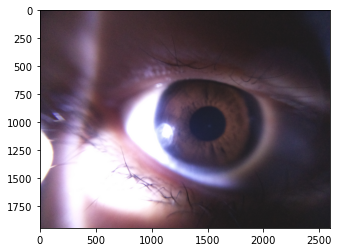

In [4]:
# SHOW SAMPLE OF ORIGINAL IMAGE

filePath = "./Data/G3/images_original/G3_L1.png"
original = cv2.imread(filename=filePath)
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
print(original.shape)
plt.imshow(original)

(1944, 2592, 3)


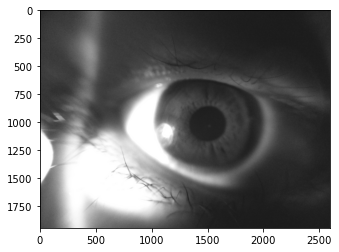

In [5]:
# SHOW SAMPLE OF GRAYSCALED IMAGE

filePath = "./Data/G3/images/G3_L1.png"
gray = cv2.imread(filename=filePath)
print(gray.shape)
plt.imshow(gray, cmap='gray')

## Load data

Allocate pre-processed images from "images" and target from "labels" into train and test set.

In this code, the model is only trained on G3 images. G1 images are used as out-of-sample test data.

In [223]:
import fnmatch

num_G3_total = len(fnmatch.filter(os.listdir('./Data/G3/images/'),'*.png')) # Grade 3 - Healthy eyes
#num_G2_total = len(fnmatch.filter(os.listdir('./Data/G2/images/'),'*.png')) # Grade 2
num_G1_total = len(fnmatch.filter(os.listdir('./Data/G1/images/'),'*.png')) # Grade 1
print( 'Number of Grade 3 images:', num_G3_total) #58
#print( 'Number of Grade 2 images:', num_G2_total)
#print( 'Number of Grade 1 images:', num_G1_total)

print( 'Total number of images:', num_G3_total) # + num_G2_total+ num_G1_total

Number of Grade 3 images: 58
Total number of images: 58


In [13]:
# ALLOCATE TRAIN AND TEST

# percentage used for testing - can be changed
percentage_testing = 0.3

#num_G1_testing  = int(num_G1_total * percentage_testing)
#num_G1_training = num_G1_total - num_G1_testing
#num_G2_testing  = int(num_G2_total * percentage_testing)
#num_G2_training = num_G2_total - num_G2_testing
num_G3_testing  = int(num_G3_total * percentage_testing)
num_G3_training = num_G3_total - num_G3_testing

num_training = num_G3_training #+ num_G2_training + num_G1_training
num_testing  = num_G3_testing  #+ num_G2_testing  + num_G1_testing
print( 'Number of Training images:', num_training)
print( 'Number of Testing images:', num_testing)

#files_G1_images = sorted(os.listdir(os.path.join('./Data/G1/images/'))) # LABEL A SUB FOLDER AS IMAGES (ORIGINAL)
#files_G2_images = sorted(os.listdir(os.path.join('./Data/G2/images/')))
files_G3_images = sorted(os.listdir(os.path.join('./Data/G3/images/')))
#files_G1_labels = sorted(os.listdir(os.path.join('./Data/G1/labels/'))) # LABEL A SUB FOLDER AS LABELS (PNG FROM AVIZO)
#files_G2_labels = sorted(os.listdir(os.path.join('./Data/G2/labels/')))
files_G3_labels = sorted(os.listdir(os.path.join('./Data/G3/labels/')))

Number of Training images: 41
Number of Testing images: 17


In [14]:
k = 0
row = 256
col = 256
num_classes = 5 # CHANGE ACCORDING TO HOW MANY MATERIALS used in segmentation

# Define some arrays --- This is for Keras
X_train    = np.ndarray(shape=(num_training, row, col,           1), dtype='d')
Y_train    = np.ndarray(shape=(num_training, row, col, num_classes), dtype='d')
X_test     = np.ndarray(shape=(num_testing , row, col,           1), dtype='d')
Y_test     = np.ndarray(shape=(num_testing , row, col, num_classes), dtype='d')

In [15]:
# Training Set--------------------------------------------------------------------------------
print("TRAINING SET:")
for i in range(num_G3_training):
    
    # add image
    im = plt.imread(os.path.join('./Data/G3/images/',files_G3_images[i+1]))
    X_train[k,:,:,0] = cv2.resize(im, dsize=(col, row), interpolation=cv2.INTER_LINEAR)
    
    la = plt.imread(os.path.join('./Data/G3/labels/',files_G3_labels[i+1]))
    
    # add label
    rla = cv2.resize(la[:,:], dsize=(col, row), interpolation=cv2.INTER_NEAREST)
    for j in range(num_classes):
        temp = np.copy(rla)+1
        temp[temp!=j+1] = 0
        Y_train[k,:,:,j] = temp/(j+1)
    k = k+1
    print(files_G3_images[i+1]+', '+files_G3_labels[i+1]+' added')
    
print("Done!")

#for i in range(num_G2_training):
#    im = plt.imread(os.path.join('./Data/G2/images/',files_G2_images[i]))
#    #im = compensation(im)
#    X_train[k,:,:,0] = cv2.resize(im, dsize=(col, row), interpolation=cv2.INTER_LINEAR)
#    la = png.read_png_int(os.path.join('./Data/G2/labels/',files_G2_labels[i]))
#    rla = cv2.resize(la[:,:,0], dsize=(col, row), interpolation=cv2.INTER_NEAREST)
#    for j in range(num_classes):
#        temp = np.copy(rla)+1
#        temp[temp!=j+1] = 0
#        Y_train[k,:,:,j] = temp/(j+1)
#    k = k+1
#    
#for i in range(num_G1_training):
#    im = plt.imread(os.path.join('./Data/G1/images/',files_G1_images[i]))
#    #im = compensation(im)
#    X_train[k,:,:,0] = cv2.resize(im, dsize=(col, row), interpolation=cv2.INTER_LINEAR)
#    la = png.read_png_int(os.path.join('./Data/G1/labels/',files_G1_labels[i]))
#    if(np.ndim(la)==3):
#        rla = cv2.resize(la[:,:,0], dsize=(col, row), interpolation=cv2.INTER_NEAREST)
#    else: 
#        rla = cv2.resize(la, dsize=(col, row), interpolation=cv2.INTER_NEAREST)
#    for j in range(num_classes):
#        temp = np.copy(rla)+1
#        temp[temp!=j+1] = 0
#        Y_train[k,:,:,j] = temp/(j+1)
#    k = k+1

TRAINING SET:
G3_L1.png, G3_L1.labels.png added
G3_L10.png, G3_L10.labels.png added
G3_L11.png, G3_L11.labels.png added
G3_L12.png, G3_L12.labels.png added
G3_L13.png, G3_L13.labels.png added
G3_L14.png, G3_L14.labels.png added
G3_L15.png, G3_L15.labels.png added
G3_L16.png, G3_L16.labels.png added
G3_L17.png, G3_L17.labels.png added
G3_L18.png, G3_L18.labels.png added
G3_L19.png, G3_L19.labels.png added
G3_L2.png, G3_L2.labels.png added
G3_L20.png, G3_L20.labels.png added
G3_L21.png, G3_L21.labels.png added
G3_L22.png, G3_L22.labels.png added
G3_L23.png, G3_L23.labels.png added
G3_L24.png, G3_L24.labels.png added
G3_L25.png, G3_L25.labels.png added
G3_L26.png, G3_L26.labels.png added
G3_L27.png, G3_L27.labels.png added
G3_L28.png, G3_L28.labels.png added
G3_L29.png, G3_L29.labels.png added
G3_L3.png, G3_L3.labels.png added
G3_L4.png, G3_L4.labels.png added
G3_L5.png, G3_L5.labels.png added
G3_L6.png, G3_L6.labels.png added
G3_L7.png, G3_L7.labels.png added
G3_L8.png, G3_L8.labels.png 

In [21]:
# Testing Set--------------------------------------------------------------------------------
print("TESTING SET:")
k=0
for i in range(num_G3_testing):
    
    # add image
    im = plt.imread(os.path.join('./Data/G3/images/',files_G3_images[num_G3_training+1+i]))
    X_test[k,:,:,0] = cv2.resize(im, dsize=(col, row), interpolation=cv2.INTER_LINEAR)
    
    # add label
    la = plt.imread(os.path.join('./Data/G3/labels/',files_G3_labels[num_G3_training+i]))
    rla = cv2.resize(la[:,:], dsize=(col, row), interpolation=cv2.INTER_NEAREST)
    
    for j in range(num_classes):
        temp = np.copy(rla)+1
        temp[temp!=j+1] = 0
        Y_test[k,:,:,j] = temp/(j+1)
    k = k+1
    
    print(files_G3_images[num_G3_training+1+i]+', '+files_G3_labels[num_G3_training+i]+' added')
    #if "list index out of range" just add +1 or remove +1. This is due to the .ipynb_checkpoints folder

print("Done!")

#for i in range(num_G2_testing):
#    im = plt.imread(os.path.join('./Data/G2/images/',files_G2_images[num_pap_training+i]))
#    #im = compensation(im)
#    X_test[k,:,:,0] = cv2.resize(im, dsize=(col, row), interpolation=cv2.INTER_LINEAR)
#    la = png.read_png_int(os.path.join('./Data/G2/labels/',files_G2_labels[num_pap_training+i]))
#    rla = cv2.resize(la[:,:,0], dsize=(col, row), interpolation=cv2.INTER_NEAREST)
#    for j in range(num_classes):
#        temp = np.copy(rla)+1
#        temp[temp!=j+1] = 0
#        Y_test[k,:,:,j] = temp/(j+1)
#    k = k+1
#    
#for i in range(num_G1_testing):
#    im = plt.imread(os.path.join('./Data/G1/images/',files_G1_images[num_nos_training+i]))
#    #im = compensation(im)
#    X_test[k,:,:,0] = cv2.resize(im, dsize=(col, row), interpolation=cv2.INTER_LINEAR)
#    la = png.read_png_int(os.path.join('./Data/G1/labels/',files_G1_labels[num_nos_training+i]))
#    if(np.ndim(la)==3):
#        rla = cv2.resize(la[:,:,0], dsize=(col, row), interpolation=cv2.INTER_NEAREST)
#    else: 
#        rla = cv2.resize(la, dsize=(col, row), interpolation=cv2.INTER_NEAREST)
#    for j in range(num_classes):
#        temp = np.copy(rla)+1
#        temp[temp!=j+1] = 0
#        Y_test[k,:,:,j] = temp/(j+1)
#    k = k+1

TESTING SET:
G3_R20.png, G3_R20.labels.png added
G3_R21.png, G3_R21.labels.png added
G3_R22.png, G3_R22.labels.png added
G3_R23.png, G3_R23.labels.png added
G3_R24.png, G3_R24.labels.png added
G3_R25.png, G3_R25.labels.png added
G3_R26.png, G3_R26.labels.png added
G3_R27.png, G3_R27.labels.png added
G3_R28.png, G3_R28.labels.png added
G3_R29.png, G3_R29.labels.png added
G3_R3.png, G3_R3.labels.png added
G3_R4.png, G3_R4.labels.png added
G3_R5.png, G3_R5.labels.png added
G3_R6.png, G3_R6.labels.png added
G3_R7.png, G3_R7.labels.png added
G3_R8.png, G3_R8.labels.png added
G3_R9.png, G3_R9.labels.png added
Done!


In [26]:
# Direct into Train, Validation, and Test Folders
x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'trainannot')
#x_valid_dir = os.path.join(DATA_DIR, 'val')
#y_valid_dir = os.path.join(DATA_DIR, 'valannot')
x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'testannot')

# We delete all the files in them in case we want to change the proportions
for f in glob.glob(os.path.join(x_train_dir,'*')): os.remove(f)
for f in glob.glob(os.path.join(y_train_dir,'*')): os.remove(f)
#for f in glob.glob(os.path.join(x_valid_dir,'*')): os.remove(f)
#for f in glob.glob(os.path.join(y_valid_dir,'*')): os.remove(f)
for f in glob.glob(os.path.join(x_test_dir,'*')): os.remove(f)
for f in glob.glob(os.path.join(y_test_dir,'*')): os.remove(f)
    
# Training Set--------------------------------------------------------------------------------
print("TRAIN FOLDERS:")
for i in range(num_G3_training):    
    shutil.copy(os.path.join('./Data/G3/images/',files_G3_images[i+1]), x_train_dir)
    shutil.copy(os.path.join('./Data/G3/labels/',files_G3_labels[i+1]), y_train_dir)  
    print(files_G3_images[i+1]+', '+files_G3_labels[i+1]+' copied!')
#for i in range(num_G2_training):
#    shutil.copy(os.path.join('./Data/G2/images/',files_G2_images[i]), x_train_dir)
#    shutil.copy(os.path.join('./Data/G2/labels/',files_G2_labels[i]), y_train_dir)    
#for i in range(num_G1_training):
#    shutil.copy(os.path.join('./Data/G1/images/',files_G1_images[i]), x_train_dir)
#    shutil.copy(os.path.join('./Data/G1/labels/',files_G1_labels[i]), y_train_dir)    

# Testing Set--------------------------------------------------------------------------------
print("TEST FOLDERS:")
for i in range(num_G3_testing):
    shutil.copy(os.path.join('./Data/G3/images/',files_G3_images[num_G3_training+1+i]), x_test_dir)
    shutil.copy(os.path.join('./Data/G3/labels/',files_G3_labels[num_G3_training+i]), y_test_dir)
    print(files_G3_images[num_G3_training+1+i]+', '+files_G3_labels[num_G3_training+i]+' copied!')
#for i in range(num_pap_testing):
#    shutil.copy(os.path.join('./Data/Papilledema/images/',files_pap_images[num_pap_training+i]), x_test_dir)
#    shutil.copy(os.path.join('./Data/Papilledema/labels/',files_pap_labels[num_pap_training+i]), y_test_dir)        
#for i in range(num_nos_testing):
#    shutil.copy(os.path.join('./Data/NoSwelling/images/',files_nos_images[num_nos_training+i]), x_test_dir)
#    shutil.copy(os.path.join('./Data/NoSwelling/labels/',files_nos_labels[num_nos_training+i]), y_test_dir) 
    
# Validation Set--------------------------------------------------------------------------------
#for i in range(num_dru_testing):
#    shutil.copy(os.path.join('./Data/Drusen/images/',files_dru_images[num_dru_training+i]), x_valid_dir)
#    shutil.copy(os.path.join('./Data/Drusen/labels/',files_dru_labels[num_dru_training+i]), y_valid_dir)        
#for i in range(num_pap_testing):
#    shutil.copy(os.path.join('./Data/Papilledema/images/',files_pap_images[num_pap_training+i]), x_valid_dir)
#    shutil.copy(os.path.join('./Data/Papilledema/labels/',files_pap_labels[num_pap_training+i]), y_valid_dir)        
#for i in range(num_nos_testing):
#    shutil.copy(os.path.join('./Data/NoSwelling/images/',files_nos_images[num_nos_training+i]), x_valid_dir)
#    shutil.copy(os.path.join('./Data/NoSwelling/labels/',files_nos_labels[num_nos_training+i]), y_valid_dir) 

TRAIN FOLDERS:
G3_L1.png, G3_L1.labels.png copied!
G3_L10.png, G3_L10.labels.png copied!
G3_L11.png, G3_L11.labels.png copied!
G3_L12.png, G3_L12.labels.png copied!
G3_L13.png, G3_L13.labels.png copied!
G3_L14.png, G3_L14.labels.png copied!
G3_L15.png, G3_L15.labels.png copied!
G3_L16.png, G3_L16.labels.png copied!
G3_L17.png, G3_L17.labels.png copied!
G3_L18.png, G3_L18.labels.png copied!
G3_L19.png, G3_L19.labels.png copied!
G3_L2.png, G3_L2.labels.png copied!
G3_L20.png, G3_L20.labels.png copied!
G3_L21.png, G3_L21.labels.png copied!
G3_L22.png, G3_L22.labels.png copied!
G3_L23.png, G3_L23.labels.png copied!
G3_L24.png, G3_L24.labels.png copied!
G3_L25.png, G3_L25.labels.png copied!
G3_L26.png, G3_L26.labels.png copied!
G3_L27.png, G3_L27.labels.png copied!
G3_L28.png, G3_L28.labels.png copied!
G3_L29.png, G3_L29.labels.png copied!
G3_L3.png, G3_L3.labels.png copied!
G3_L4.png, G3_L4.labels.png copied!
G3_L5.png, G3_L5.labels.png copied!
G3_L6.png, G3_L6.labels.png copied!
G3_L7.png

### Visualize function

Takes in images as arrays and prints them using Matplotlib.

In [239]:
# helper function for data visualization
def visualize(**images):
    """Plot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

### Dataloader

Writing helper class for data extraction, tranformation and preprocessing  
https://pytorch.org/docs/stable/data

In [28]:
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

In [29]:
class Dataset(BaseDataset):
    """CamVid Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    
    CLASSES = ['0','1', '2', '3','4'] # 4 materials used in segmentation
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            classes=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.ids = sorted(os.listdir(images_dir))
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        #self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]
        
        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.resize(image, dsize=(480, 320), interpolation=cv2.INTER_NEAREST)
                        
        # Apply compensation on 2 channels - WHY NOT???? Note the compensation function uses 255
        #image[:,:,0] = compensation(image[:,:,0],2)
        #image[:,:,1] = compensation(image[:,:,1],2)
        #image[:,:,2] = compensation(image[:,:,2],2)
        
        mask = cv2.imread(self.masks_fps[i], 0)
        mask = cv2.resize(mask, dsize=(480, 320), interpolation=cv2.INTER_NEAREST)
                
        # extract certain classes from mask (e.g. cars)
        masks = [(mask == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')
                        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        return len(self.ids)

In [30]:
# Lets look at data we have

dataset = Dataset(x_train_dir, y_train_dir, classes=['0','1','2','3','4']) # Somehow need one more class than required to work
print("Done!")

Done!


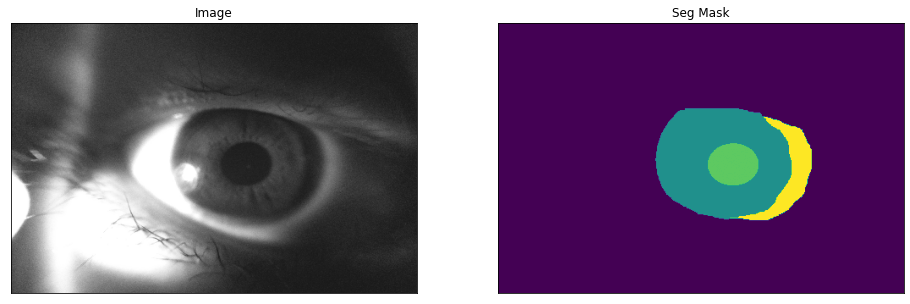

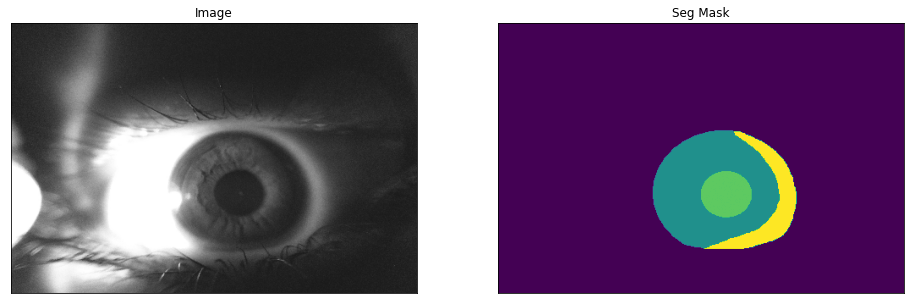

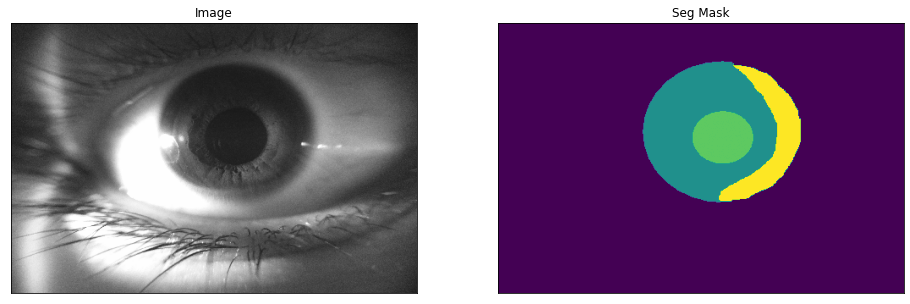

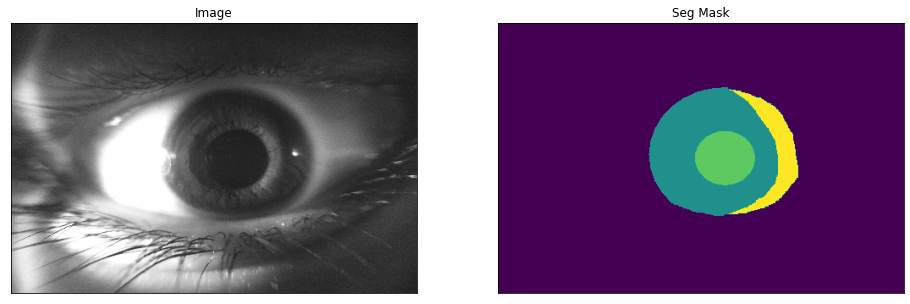

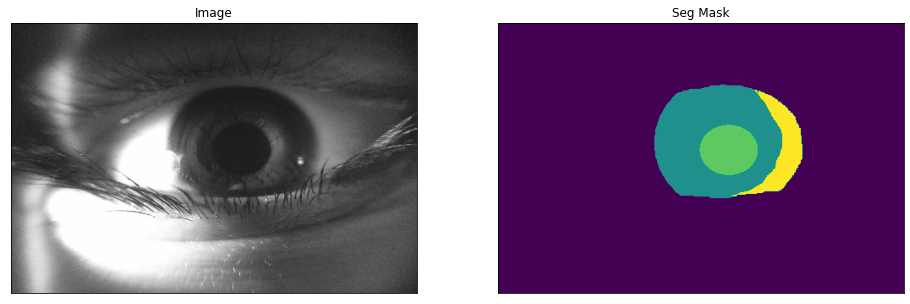

...

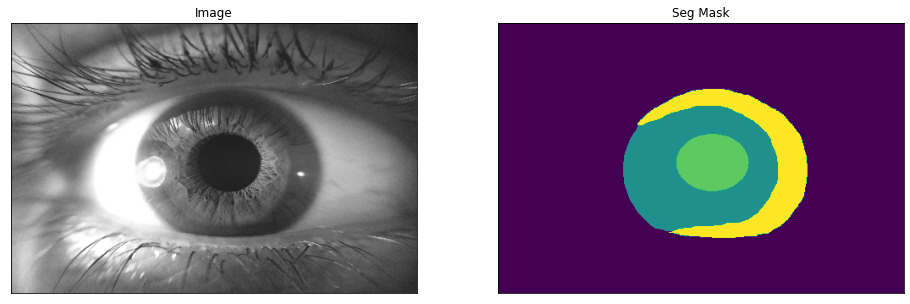

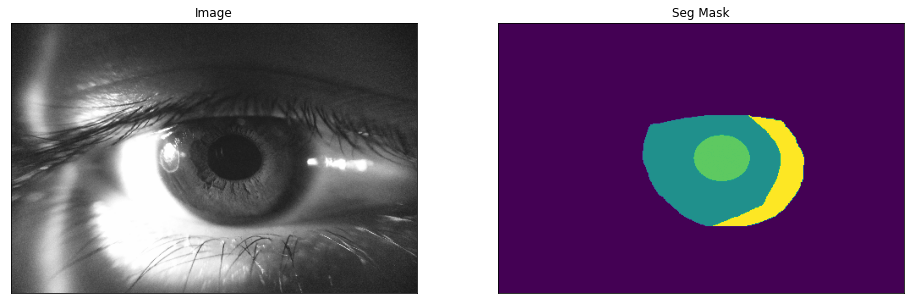

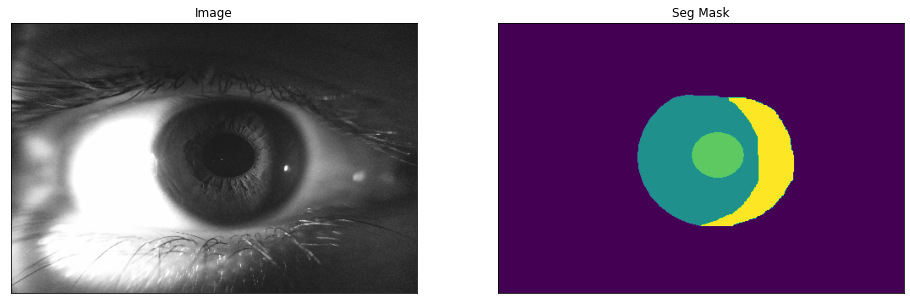

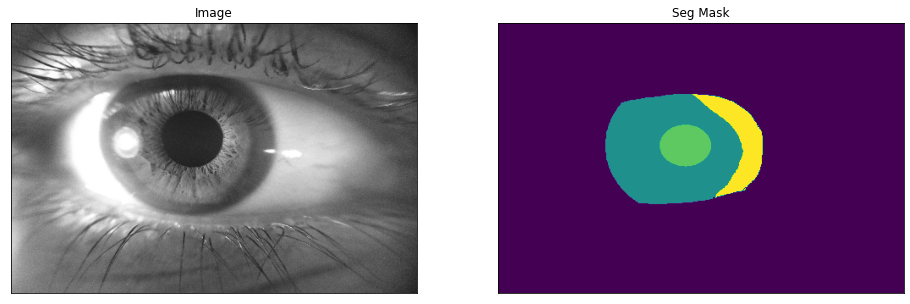

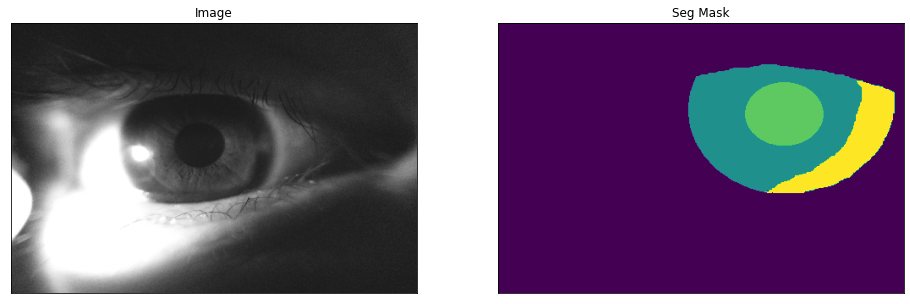

In [31]:
# print everything
for i in range(num_training):
    image, mask = dataset[i] # get some sample

    mask2 = np.zeros((mask.shape[0], mask.shape[1]))
    for i in range(num_classes): 
        mask2  +=  mask[:,:,i]*i

    visualize(
        image=image, 
        seg_mask=mask2.squeeze(),
    )

### Augmentations

Data augmentation is a powerful technique to increase the amount of your data and prevent model overfitting.  
If you not familiar with such trick read some of these articles:
 - [The Effectiveness of Data Augmentation in Image Classification using Deep
Learning](http://cs231n.stanford.edu/reports/2017/pdfs/300.pdf)
 - [Data Augmentation | How to use Deep Learning when you have Limited Data](https://medium.com/nanonets/how-to-use-deep-learning-when-you-have-limited-data-part-2-data-augmentation-c26971dc8ced)
 - [Data Augmentation Experimentation](https://towardsdatascience.com/data-augmentation-experimentation-3e274504f04b)

Since our dataset is very small we will apply a large number of different augmentations:
 - horizontal flip
 - affine transforms
 - perspective transforms
 - brightness/contrast/colors manipulations
 - image bluring and sharpening
 - gaussian noise
 - random crops

All this transforms can be easily applied with [**Albumentations**](https://github.com/albu/albumentations/) - fast augmentation library.
For detailed explanation of image transformations you can look at [kaggle salt segmentation exmaple](https://github.com/albu/albumentations/blob/master/notebooks/example_kaggle_salt.ipynb) provided by [**Albumentations**](https://github.com/albu/albumentations/) authors.

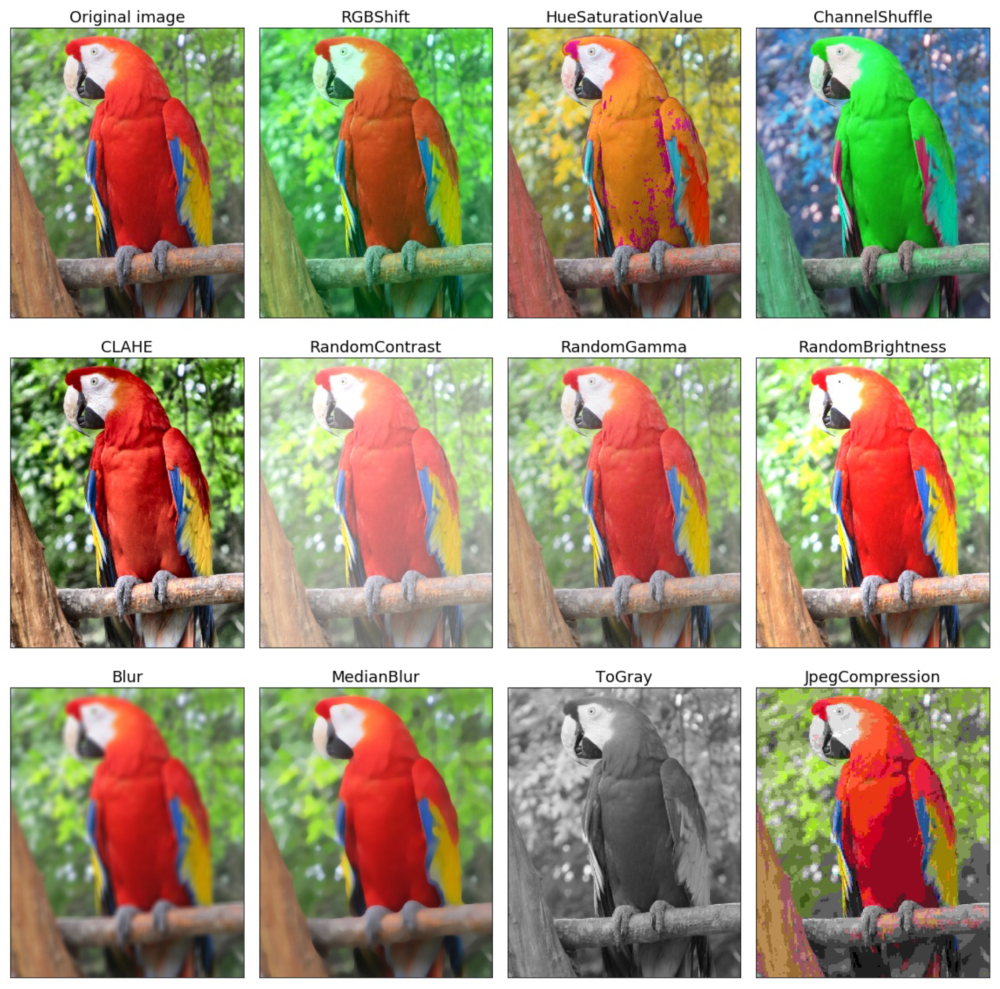
https://www.mdpi.com/information/information-11-00125/article_deploy/html/images/information-11-00125-g001.png

In [32]:
import albumentations as albu

In [84]:
# ORIGINAL AUGMENTATIONS
def get_training_augmentation():
        
    train_transform = [

        albu.VerticalFlip(p=0.5), # Vertical flip to simulate difference between left and right eye.

        albu.ShiftScaleRotate(scale_limit=0.1, rotate_limit=1, shift_limit=0.01, p=1, border_mode=0),
        
        #albu.RandomBrightness(limit=0.1, p=0.8),
        #albu.RandomContrast(limit=0.1, p=0.8),
        #albu.Blur(blur_limit=3, p=0.8),
        #albu.MotionBlur(blur_limit=3, p=0.8),

        albu.OneOf(
            [
                albu.CLAHE(p=1),
                albu.RandomBrightness(limit=0.1, p=1),
                albu.RandomGamma(p=1),
            ],
            p=0.8,
        ),

        albu.OneOf(
            [
            #    albu.IAASharpen(p=1),
                albu.Blur(blur_limit=3, p=1),
                albu.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.8,
        ),

        albu.OneOf(
            [
                albu.RandomContrast(p=1),
            ],
            p=0.5,
        ),
    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        albu.PadIfNeeded(384, 480)
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

Size of augmented dataset:  41


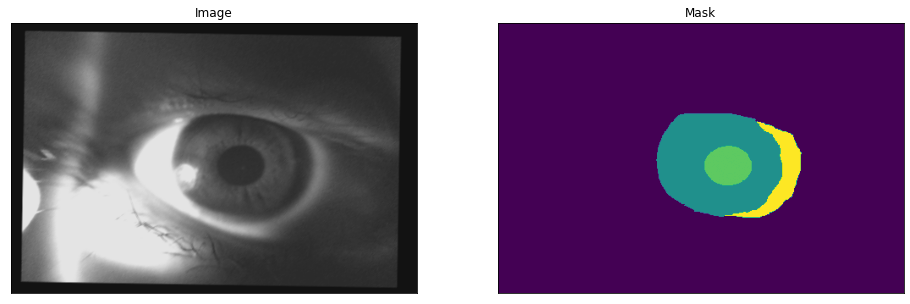

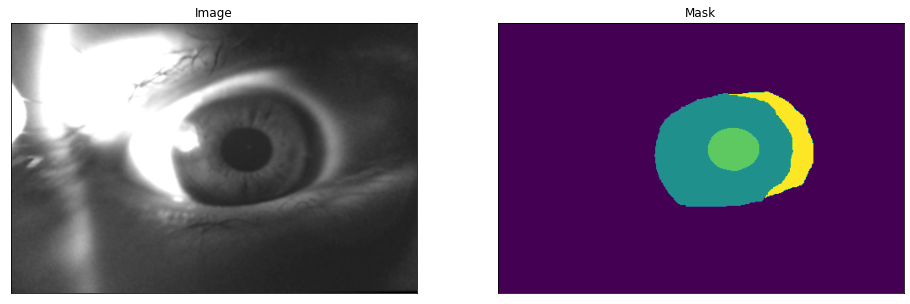

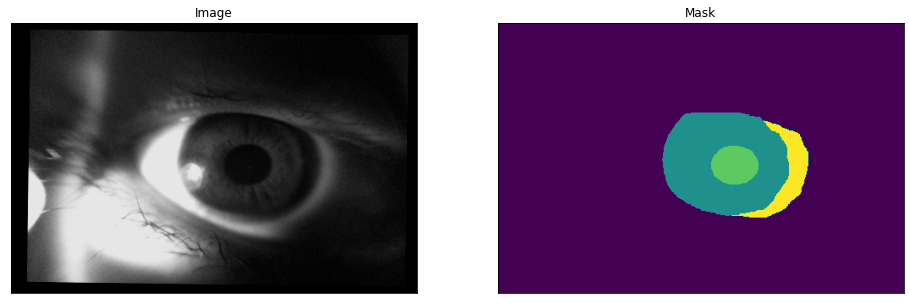

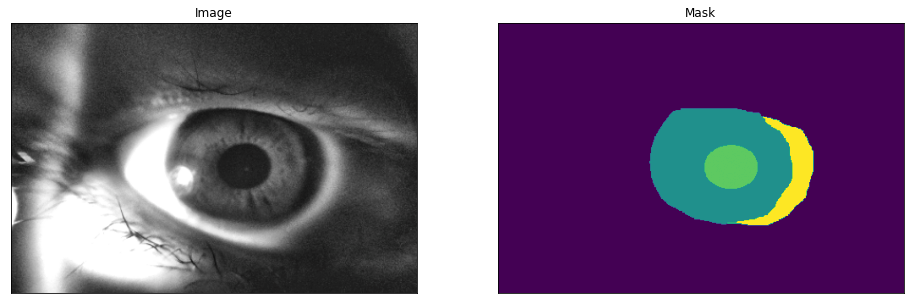

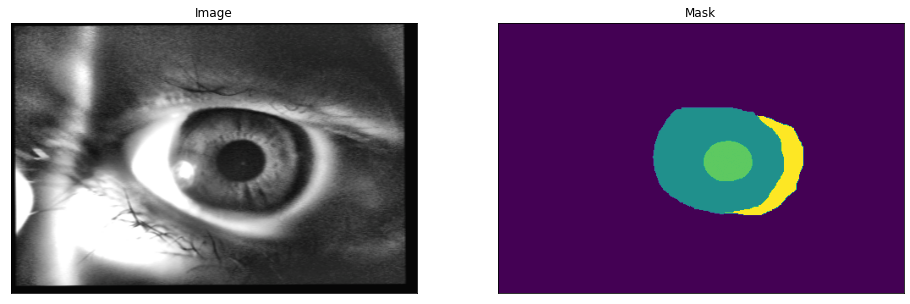

In [85]:
#### Visualize resulted augmented images and masks

augmented_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    augmentation=get_training_augmentation(), 
    classes=['0','1','2','3','4'],
)

print("Size of augmented dataset: ", len(augmented_dataset))

# same image with different random transforms
for i in range(5):
    image, mask = augmented_dataset[0]
    mask2 = np.zeros((mask.shape[0], mask.shape[1]))
    for j in range(num_classes): mask2  +=  mask[:,:,j]*j
    visualize(image=image, mask=mask2.squeeze())

## Create model and train

In [86]:
import torch
import numpy as np
import segmentation_models_pytorch as smp

In [271]:
ENCODER = 'resnet34'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['0','1','2','3','4']
ACTIVATION = 'softmax2d' # could be None for logits or 'softmax2d' for multicalss segmentation
DEVICE = 'cpu' #cuda

# create segmentation model with pretrained encoder
model = smp.UnetPlusPlus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    #in_channels=1,
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)
print("Model created!")

Model created!


In [272]:
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    augmentation=get_training_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
)

print("Data loaded!")

#valid_dataset = Dataset(
#    x_valid_dir, 
#    y_valid_dir, 
#    augmentation=get_validation_augmentation(), 
#    preprocessing=get_preprocessing(preprocessing_fn),
#    classes=CLASSES,
#)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=0)
# issue resolved (num_workers): https://github.com/pytorch/pytorch/issues/5301
#valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=4)

Data loaded!


In [273]:
# Dice/F1 score - https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient
# IoU/Jaccard score - https://en.wikipedia.org/wiki/Jaccard_index

loss = smp.utils.losses.JaccardLoss()
metrics = [
    #smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [274]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

print("Done!")

#valid_epoch = smp.utils.train.ValidEpoch(
#    model, 
#    loss=loss, 
#    metrics=metrics, 
#    device=DEVICE,
#    verbose=True,
#)

Done!


In [324]:
# train model for specific number of epochs

max_score = 0

for i in range(0, 10): # MUST CHANGE THE NUMBER OF EPOCHS
    #t_start = process_time()

    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    #valid_logs = valid_epoch.run(valid_loader)
    
    torch.save(model.state_dict(),'./essai.pth')
    
    # do something (save model, change lr, etc.)
    if max_score < train_logs['fscore']:
        max_score = train_logs['fscore']
        
        # ALWAYS CHANGE THE NAME OF THE SAVED MODEL; must change the testing code down below
        torch.save(model, './Models/best_model_training_epoch_100.pth') # best_UnetPlusPlus_Resnet34_Jaccard_PLUS_COMP_TRAINING7
        print('Model saved!')
        
    if i == 1:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')
    
    #t_stop = process_time()
    #print("Training duration: "+ str(t_stop-t_start))


Epoch: 0
train: 100%|█████████████████████████████████████| 6/6 [01:08<00:00, 11.44s/it, jaccard_loss - 0.8559, fscore - 0.7569]
Model saved!

Epoch: 1
train: 100%|█████████████████████████████████████| 6/6 [01:00<00:00, 10.07s/it, jaccard_loss - 0.8608, fscore - 0.7371]
Decrease decoder learning rate to 1e-5!

Epoch: 2
train: 100%|█████████████████████████████████████| 6/6 [00:57<00:00,  9.59s/it, jaccard_loss - 0.8667, fscore - 0.7235]

Epoch: 3
train: 100%|█████████████████████████████████████| 6/6 [00:57<00:00,  9.51s/it, jaccard_loss - 0.8582, fscore - 0.7497]

Epoch: 4
train: 100%|███████████████████████████████████████| 6/6 [00:57<00:00,  9.54s/it, jaccard_loss - 0.8567, fscore - 0.75]

Epoch: 5
train: 100%|█████████████████████████████████████| 6/6 [00:57<00:00,  9.61s/it, jaccard_loss - 0.8566, fscore - 0.7576]
Model saved!

Epoch: 6
train: 100%|█████████████████████████████████████| 6/6 [00:59<00:00,  9.87s/it, jaccard_loss - 0.8617, fscore - 0.7335]

Epoch: 7
train: 100%|██

## Test best saved model on G3 test data

Model is tested on the pre-allocated test data (G3).

In [325]:
# load best saved checkpoint
best_model = torch.load('./Models/best_model_training_epoch_100.pth') # MUST CHANGE THE NAME AS WELL

In [326]:
# create test dataset with G3 data
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    #augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
)

test_dataloader = DataLoader(test_dataset)

In [327]:
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader) # COPY THE LOGS AND STORE IT SOMEWHERE

valid: 100%|███████████████████████████████████| 17/17 [00:11<00:00,  1.44it/s, jaccard_loss - 0.8504, fscore - 0.7688]


## Visualize testing predictions

All testing predictions will be saved into a folder called "results".

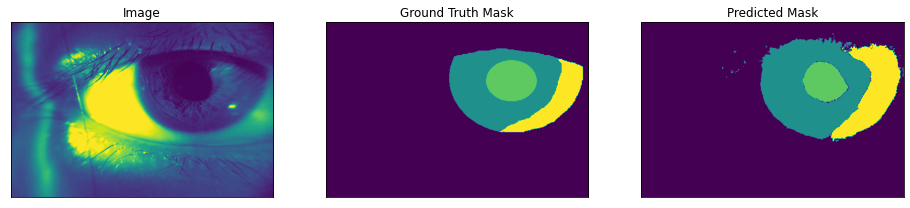

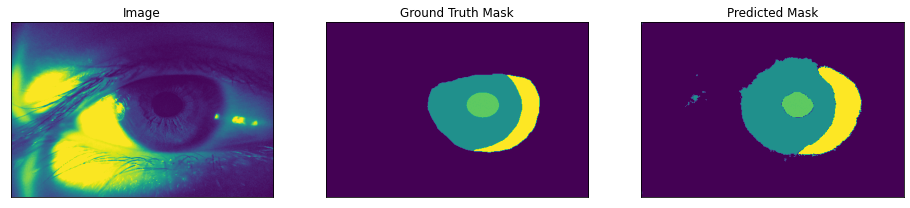

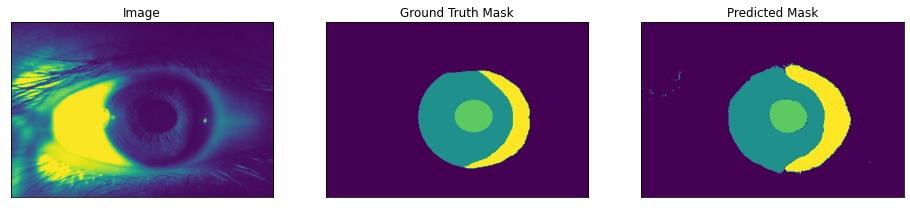

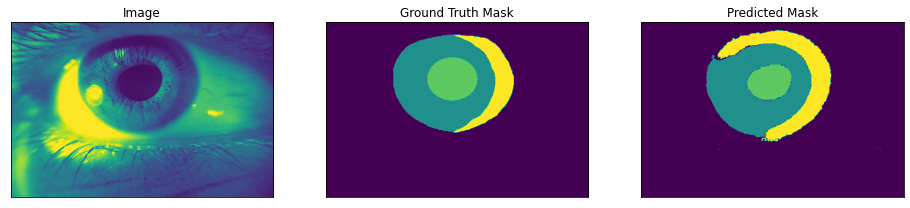

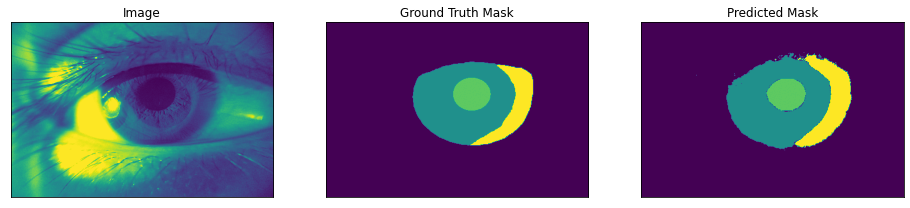

...

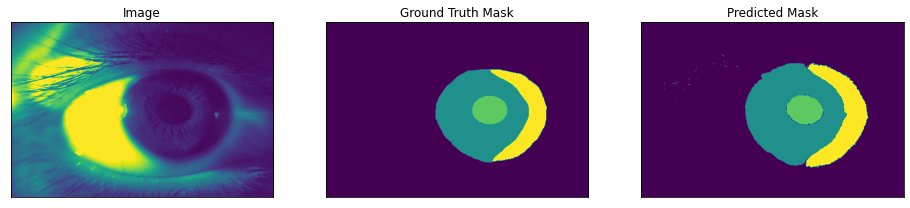

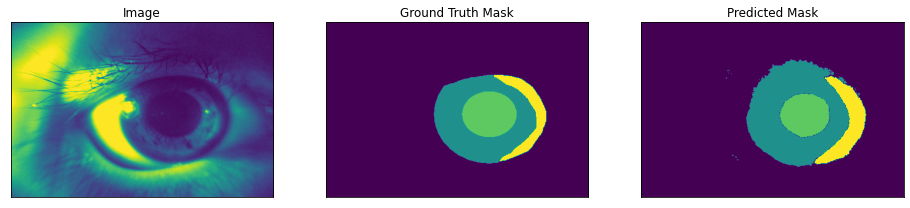

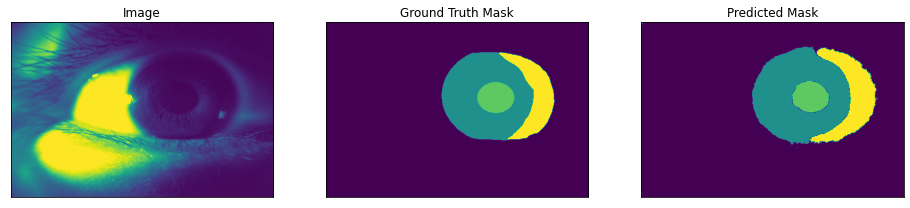

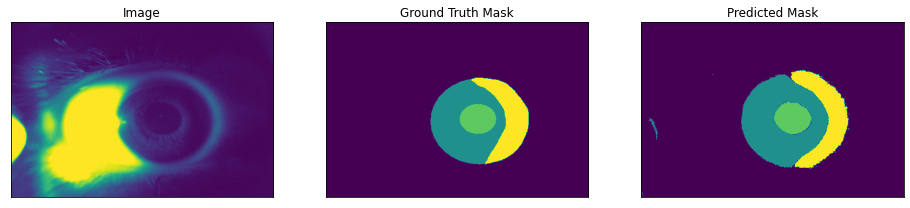

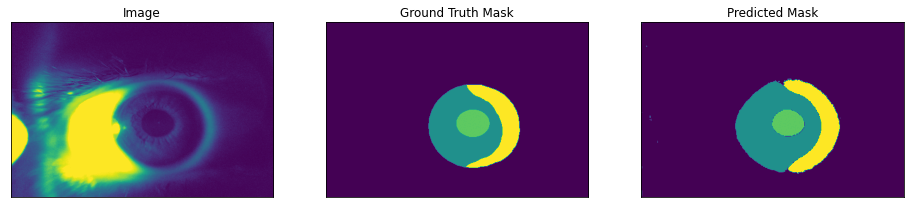

In [328]:
# test dataset without transformations for image visualization
test_dataset_vis = Dataset(
    x_test_dir, y_test_dir, 
    classes=CLASSES,
)

for n in range(len(test_dataset)):
    
    image_vis = test_dataset_vis[n][0].astype('uint8')
    image, gt_mask = test_dataset[n]
    
    gt_mask = gt_mask.squeeze()
    
    # To find out: why is image not between 0 and 1? 
    #print(image.shape)
    #print(image.dtype)

    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
    
    #reshape gt and pr masks
    gt_mask2 = np.zeros((gt_mask.shape[1], gt_mask.shape[2]))
    pr_mask2 = np.zeros((pr_mask.shape[1], pr_mask.shape[2]))
    for i in range(num_classes): gt_mask2  +=  gt_mask[i,:,:]*i
    for i in range(num_classes): pr_mask2  +=  pr_mask[i,:,:]*i

    visualize(
        image=image[0,:,:], 
        ground_truth_mask=gt_mask2, 
        predicted_mask=pr_mask2
    )

In [235]:
# custom function to save figures

def saveVisualized(**images):
    """Plot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    #plt.show()

Saving TRAINING7_0.png ...
Saving TRAINING7_1.png ...
Saving TRAINING7_2.png ...
Saving TRAINING7_3.png ...
Saving TRAINING7_4.png ...
Saving TRAINING7_5.png ...
Saving TRAINING7_6.png ...
Saving TRAINING7_7.png ...
Saving TRAINING7_8.png ...
Saving TRAINING7_9.png ...
Saving TRAINING7_10.png ...
Saving TRAINING7_11.png ...
Saving TRAINING7_12.png ...
Saving TRAINING7_13.png ...
Saving TRAINING7_14.png ...
Saving TRAINING7_15.png ...
Saving TRAINING7_16.png ...
All test results have been saved!


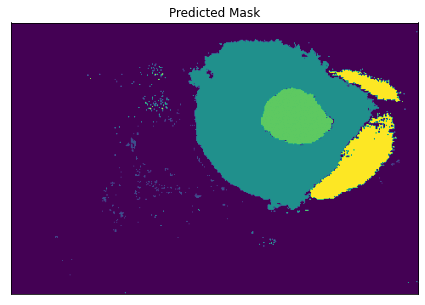

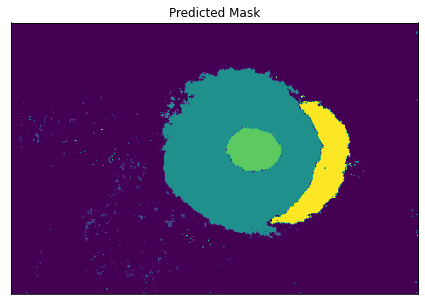

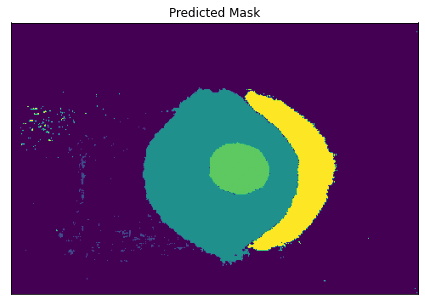

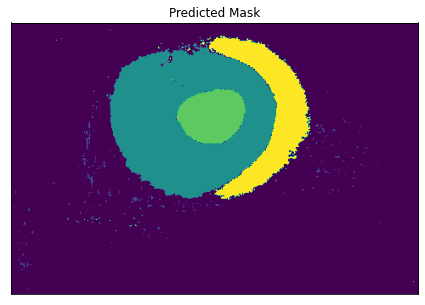

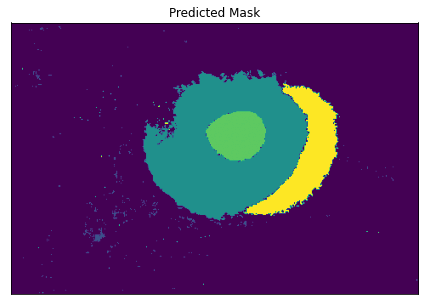

...

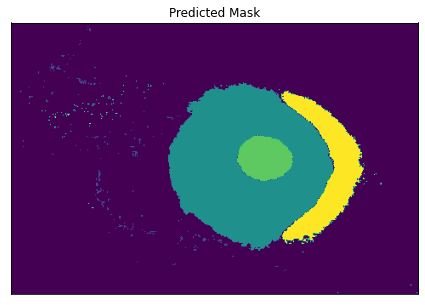

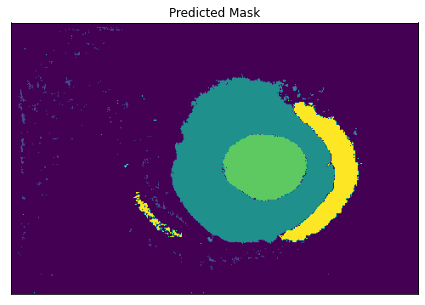

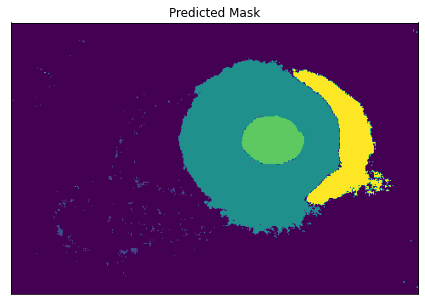

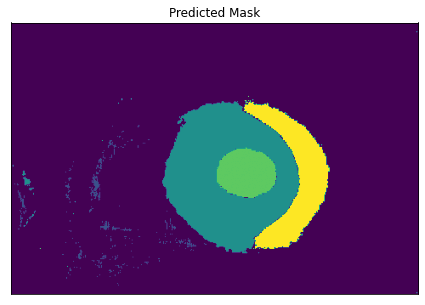

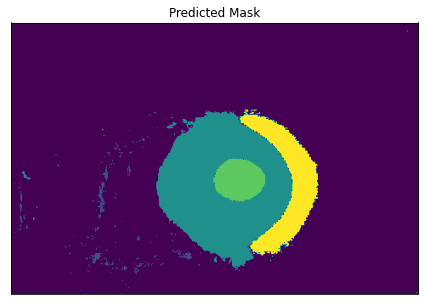

In [237]:
filedir = os.path.join('./Data/G3/results/')

for n in range(len(test_dataset)):
    #n = np.random.choice(len(test_dataset))
    
    image, gt_mask = test_dataset[n]
    
    gt_mask = gt_mask.squeeze()
    
    # To find out: why is image not between 0 and 1? 
    #print(image.shape)
    #print(image.dtype)

    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
    
    #reshape gt and pr masks
    gt_mask2 = np.zeros((gt_mask.shape[1], gt_mask.shape[2]))
    pr_mask2 = np.zeros((pr_mask.shape[1], pr_mask.shape[2]))
    for i in range(num_classes): gt_mask2  +=  gt_mask[i,:,:]*i
    for i in range(num_classes): pr_mask2  +=  pr_mask[i,:,:]*i

    saveVisualized(
        Predicted_Mask=pr_mask2
    )
    
    print('Saving TRAINING7_'+str(n)+'.png ...')
    plt.savefig(filedir + 'TRAINING7_'+str(n)+'.png') #change number accordingly
    
print("All test results have been saved!")

## Finding colour ratio

This will give some insight into the ratio of the shadow to iris.

RGB values:

- White: (255, 255, 255)
- Dark purple (background colour): (68, 1, 84)
- Teal (iris): (32, 144, 140)
- Yellow (shadow): (253, 231, 36)
- Green (pupil): (94, 201, 97)
- Black: (13, 0, 17)

*Numbers with very similar values can be counted towards the colour category

In [209]:
def getShadowRatio(filePath):
    
    # STEP 1: get array of all the pixels and colours in the image file
    img = Image.open(os.path.join(filePath))
    colours = img.convert('RGB').getcolors(img.size[0]*img.size[1]) #uses RGB format
    colours.sort()
    colours.reverse()
    main_colours = colours[:5] # get only the top 5 colours used
    #print("Top five colours: ", main_colours)
    
    # STEP 2: count shadow and iris pixels according to colours
    # assume that colours are standardised (can check by printing top 5 colours of all images)
    shadow, iris = 0, 0 
    for n in range(len(main_colours)):
        
        pixels = main_colours[n][0]
        rgbval = main_colours[n][1]
        
        if rgbval == (253, 231, 36): #yellow - shadow
            shadow = pixels
            iris += pixels
        elif rgbval == (32, 144, 140): #teal - iris
            iris += pixels
        elif rgbval == (94, 201, 97): #green - pupil
            iris += pixels
    
    #print("FOR IMAGE ", filePath)
    #print("Shadow pixels: ", shadow, "       Iris pixels: ", iris)
    
    shadow_ratio = shadow/iris
    return shadow_ratio

In [219]:
for i in range(len(test_dataset)):
    filePath = './Data/G3/results/TRAINING7_'+str(i)+'.png'
    ratio = getShadowRatio(filePath)
    print("FOR IMAGE: ", filePath, "        Ratio: ", ratio)

FOR IMAGE:  ./Data/G3/results/TRAINING7_0.png         Ratio:  0.1478351319724353
FOR IMAGE:  ./Data/G3/results/TRAINING7_1.png         Ratio:  0.1515783618411904
FOR IMAGE:  ./Data/G3/results/TRAINING7_2.png         Ratio:  0.22361336076697458
FOR IMAGE:  ./Data/G3/results/TRAINING7_3.png         Ratio:  0.22768361581920904
FOR IMAGE:  ./Data/G3/results/TRAINING7_4.png         Ratio:  0.1980398100434475
FOR IMAGE:  ./Data/G3/results/TRAINING7_5.png         Ratio:  0.1462166364343094
FOR IMAGE:  ./Data/G3/results/TRAINING7_6.png         Ratio:  0.24132389349780653
FOR IMAGE:  ./Data/G3/results/TRAINING7_7.png         Ratio:  0.18103517026876145
FOR IMAGE:  ./Data/G3/results/TRAINING7_8.png         Ratio:  0.239057524941626
FOR IMAGE:  ./Data/G3/results/TRAINING7_9.png         Ratio:  0.21289220107276782
FOR IMAGE:  ./Data/G3/results/TRAINING7_10.png         Ratio:  0.24365106479899784
FOR IMAGE:  ./Data/G3/results/TRAINING7_11.png         Ratio:  0.1893248879962923
FOR IMAGE:  ./Data/G3

## Out-of-sample G1 test data

There are currently 4 G1 images, which will be used as out-of-sample test data to evaluate the ability of the model to run on different grades.

In [387]:
best_model = torch.load('./Models/best_model_training_epoch_100.pth') # MUST CHANGE THE NAME AS WELL

In [388]:
x_oostest_dir = os.path.join('./Data/G1/images')
y_oostest_dir = os.path.join('./Data/G1/labels')

In [389]:
# create OOS test dataset with G1 data
oostest_dataset = Dataset(
    x_oostest_dir, 
    y_oostest_dir, 
    #augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
)

oostest_dataloader = DataLoader(oostest_dataset)

In [390]:
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(oostest_dataloader) # COPY THE LOGS AND STORE IT SOMEWHERE

valid: 100%|█████████████████████████████████████| 4/4 [00:04<00:00,  1.10s/it, jaccard_loss - 0.9451, fscore - 0.4976]


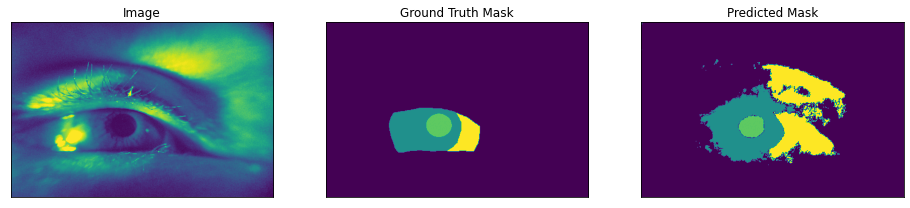

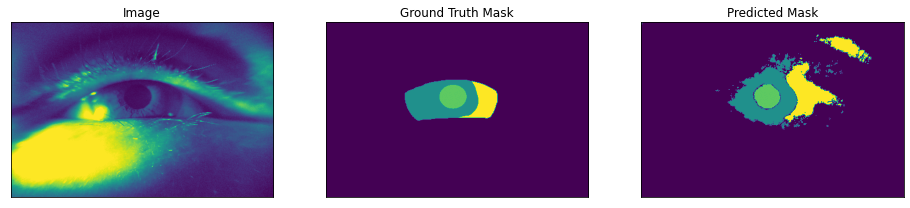

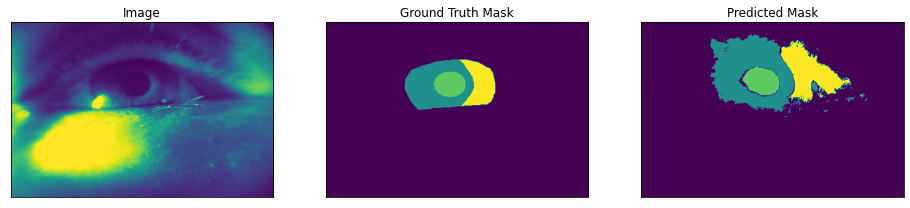

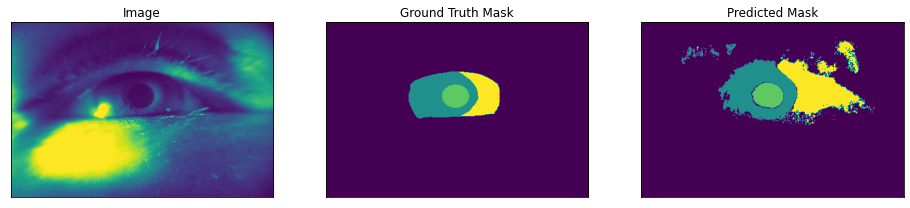

IndexError: list index out of range

In [391]:
# test dataset without transformations for image visualization
oostest_dataset_vis = Dataset(
    x_oostest_dir, y_oostest_dir, 
    classes=CLASSES,
)

for n in range(len(test_dataset)):
    
    image_vis = oostest_dataset_vis[n][0].astype('uint8')
    image, gt_mask = oostest_dataset[n]
    
    gt_mask = gt_mask.squeeze()
    
    # To find out: why is image not between 0 and 1? 
    #print(image.shape)
    #print(image.dtype)

    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
    
    #reshape gt and pr masks
    gt_mask2 = np.zeros((gt_mask.shape[1], gt_mask.shape[2]))
    pr_mask2 = np.zeros((pr_mask.shape[1], pr_mask.shape[2]))
    for i in range(num_classes): gt_mask2  +=  gt_mask[i,:,:]*i
    for i in range(num_classes): pr_mask2  +=  pr_mask[i,:,:]*i

    visualize(
        image=image[0,:,:], 
        ground_truth_mask=gt_mask2, 
        predicted_mask=pr_mask2
    )

Saving OOS_TRAINING7_0.png ...
Saving OOS_TRAINING7_1.png ...
Saving OOS_TRAINING7_2.png ...
Saving OOS_TRAINING7_3.png ...
All test results have been saved!


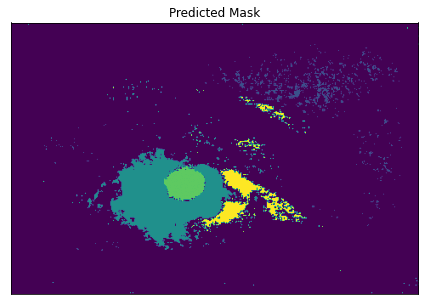

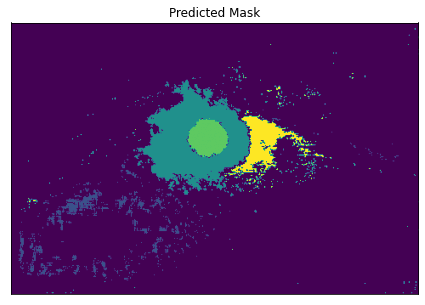

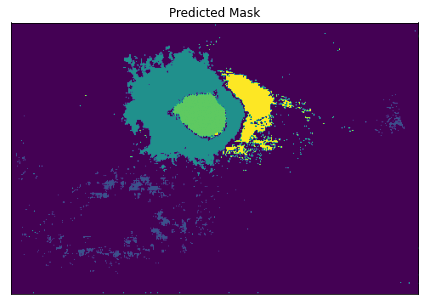

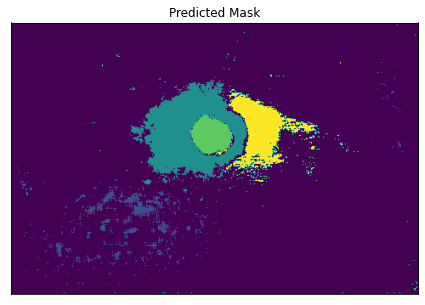

In [269]:
filedir = os.path.join('./Data/G3/results/')

for n in range(len(oostest_dataset)):
    #n = np.random.choice(len(test_dataset))
    
    image, gt_mask = oostest_dataset[n]
    
    gt_mask = gt_mask.squeeze()
    
    # To find out: why is image not between 0 and 1? 
    #print(image.shape)
    #print(image.dtype)

    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
    
    #reshape gt and pr masks
    gt_mask2 = np.zeros((gt_mask.shape[1], gt_mask.shape[2]))
    pr_mask2 = np.zeros((pr_mask.shape[1], pr_mask.shape[2]))
    for i in range(num_classes): gt_mask2  +=  gt_mask[i,:,:]*i
    for i in range(num_classes): pr_mask2  +=  pr_mask[i,:,:]*i

    saveVisualized(
        Predicted_Mask=pr_mask2
    )
    
    print('Saving OOS_TRAINING7_'+str(n)+'.png ...')
    plt.savefig(filedir + 'OOS_TRAINING7_'+str(n)+'.png') #change number accordingly
    
print("All test results have been saved!")

In [270]:
for i in range(len(oostest_dataset)):
    filePath = './Data/G3/results/OOS_TRAINING7_'+str(i)+'.png'
    ratio = getShadowRatio(filePath)
    print("FOR IMAGE: ", filePath, "        Ratio: ", ratio)

FOR IMAGE:  ./Data/G3/results/OOS_TRAINING7_0.png         Ratio:  0.15514764565043895
FOR IMAGE:  ./Data/G3/results/OOS_TRAINING7_1.png         Ratio:  0.18888546798029557
FOR IMAGE:  ./Data/G3/results/OOS_TRAINING7_2.png         Ratio:  0.16101873289833718
FOR IMAGE:  ./Data/G3/results/OOS_TRAINING7_3.png         Ratio:  0.2977827673309009


## Results and Plotting

The following results were collected after training and testing of the model over 100 epochs, and data was collected every 10 epochs to find the optimal training epoch number.

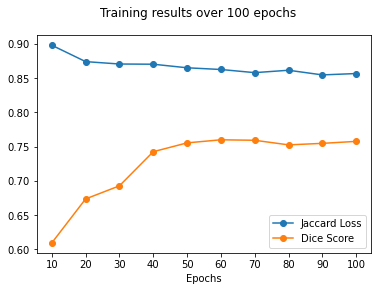

In [403]:
# TRAIN - Jaccard loss and dice for all saved models over 100 epochs (every 10 epoch)

loss_train = [0.8979, 0.874, 0.8705, 0.8702, 0.865, 0.8625, 0.8579, 0.8614, 0.8546, 0.8566]
dice_train = [0.6094, 0.6736, 0.6927, 0.7425, 0.7554, 0.7599, 0.7592, 0.7525, 0.7547, 0.7576]
x_val = [10,20,30,40,50,60,70,80,90,100]

fig = plt.figure()
fig.suptitle('Training results over 100 epochs')
plt.xlabel('Epochs')
plt.xticks(x_val,x_val)

plt.plot(x_val, loss_train, label = "Jaccard Loss", marker='o')
plt.plot(x_val, dice_train, label = "Dice Score", marker='o')
plt.legend()
plt.show()

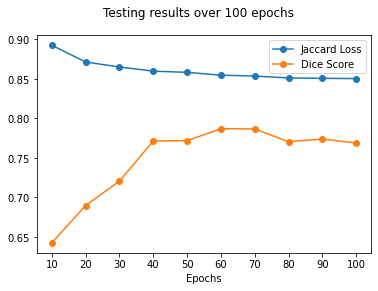

In [404]:
# TEST - Jaccard loss and dice for all saved models over 100 epochs (every 10 epoch)

loss_test = [0.8926, 0.8714, 0.8651, 0.8598, 0.8583, 0.8547, 0.8536, 0.8512, 0.8507, 0.8504]
dice_test = [0.6424, 0.6897, 0.7206, 0.7714, 0.7718, 0.787, 0.7866, 0.7705, 0.7739, 0.7688]

fig = plt.figure()
fig.suptitle('Testing results over 100 epochs')
plt.xlabel('Epochs')
plt.xticks(x_val,x_val)

plt.plot(x_val, loss_test, label = "Jaccard Loss", marker='o')
plt.plot(x_val, dice_test, label = "Dice Score", marker='o')
plt.legend()
plt.show()

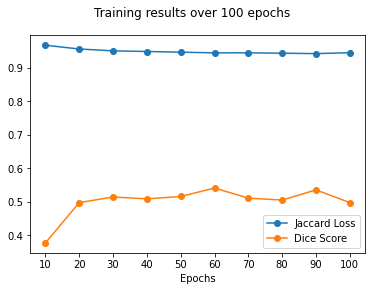

In [405]:
# OOS TEST - Jaccard loss and dice for all saved models over 100 epochs (every 10 epoch)

loss_oostest = [0.9674, 0.9562, 0.9507, 0.9487, 0.9467, 0.9447, 0.9448, 0.9436, 0.9424, 0.9451]
dice_oostest = [0.3772, 0.4975, 0.5143, 0.5088, 0.5159, 0.541, 0.5109, 0.5051, 0.5355, 0.4976]

fig = plt.figure()
fig.suptitle('Training results over 100 epochs')
plt.xlabel('Epochs')
plt.xticks(x_val,x_val)

plt.plot(x_val, loss_oostest, label = "Jaccard Loss", marker='o')
plt.plot(x_val, dice_oostest, label = "Dice Score", marker='o')
plt.legend()
plt.show()